In [1]:
from keras.models import Sequential
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.callbacks import EarlyStopping
from keras.models import load_model
from sklearn.metrics.pairwise import cosine_similarity
from keras.models import Model
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from keras.applications.mobilenet_v2 import MobileNetV2

/home/adityajakka/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
full_df = pd.read_pickle('scenes_df.pkl')

In [3]:
len(full_df)

1828

In [4]:
X_train = full_df['Numpy_Img']
X_train = np.stack(X_train, axis=0)

In [5]:
X_train.shape

(1828, 224, 224, 3)

In [6]:
model = MobileNetV2(input_shape=(224,224,3),include_top=True, weights='imagenet', pooling='max')

In [7]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu

In [8]:
layer_name = 'global_average_pooling2d_1'

In [9]:
model_final= Model(inputs=model.input, outputs= model.get_layer(layer_name).output)

In [10]:
model_final.compile(optimizer = 'adam', loss = 'squared_hinge', metrics = ['accuracy'])

In [11]:
activations = model_final.predict(X_train, verbose = 1)

1828/1828 [==============================] - 8s 4ms/step


In [12]:
poster_similarities = cosine_similarity(activations)

In [13]:
poster_similarities.shape

(1828, 1828)

In [14]:
from difflib import SequenceMatcher

def similarities(c, d):
    return SequenceMatcher(None, c, d).ratio()

In [15]:
def show_posters(index_num, X_train):
    array_nums = poster_similarities[index_num].argsort()[::-1][:8]
    fig, ax = plt.subplots(figsize=(16,8))
    j = 1
    for i in array_nums:
        plt.subplot(2,4,j)
        plt.imshow(X_train[i])
        j+=1 
    plt.suptitle(("Set of results"),fontsize=14, fontweight='bold')    

In [16]:
def display_results(search_key, default = full_df):
    random.seed(42)
    search_results = []
    for i,j in enumerate(full_df['Metadata']):
        if similarities(search_key.upper(), j.upper()) > 0.7:
            search_results.append(i)  
    shortened_list = random.sample(search_results, 4)
    for i in shortened_list:
        show_posters(i, X_train)    

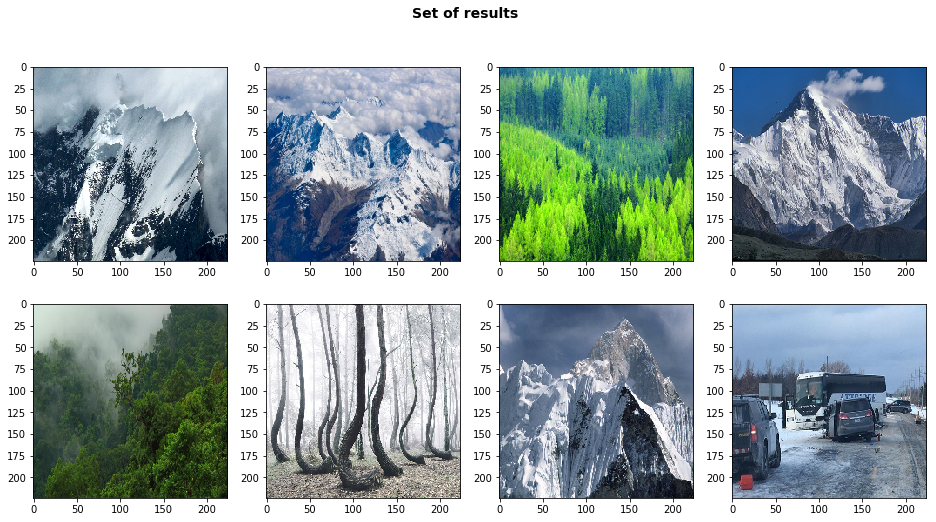

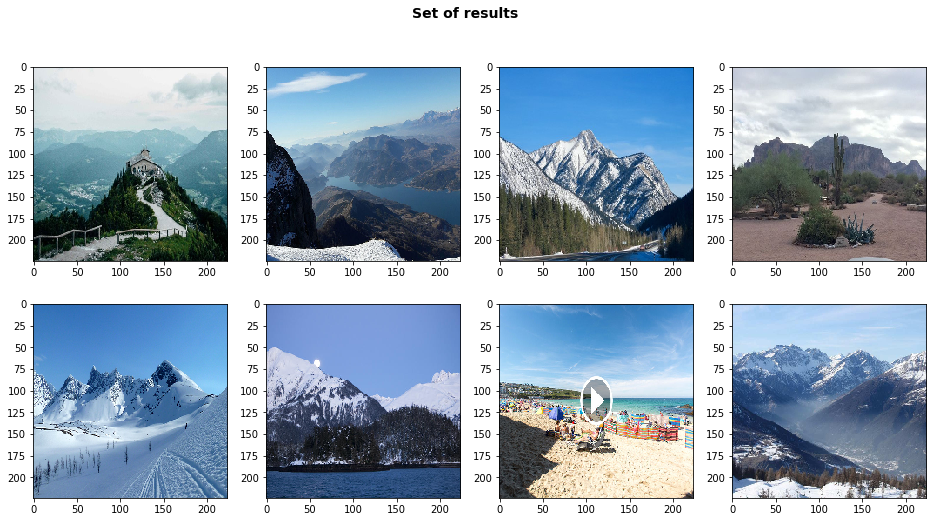

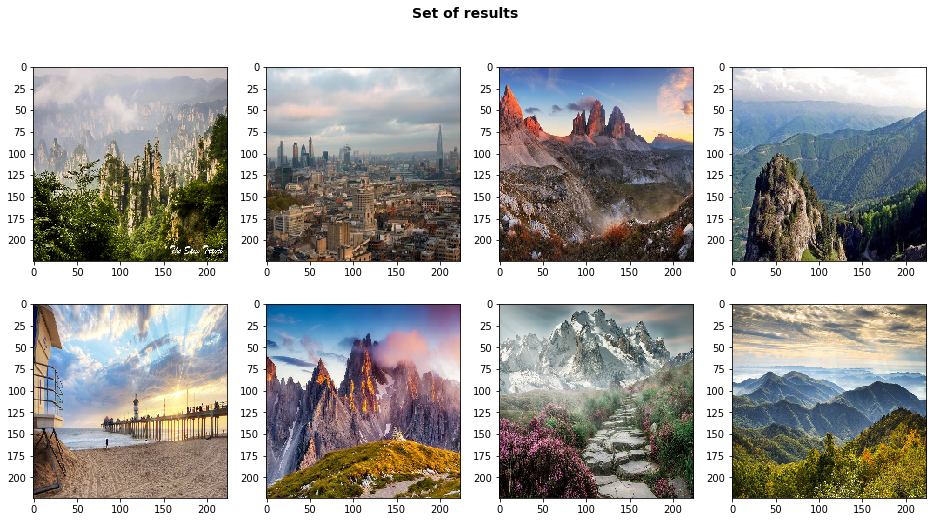

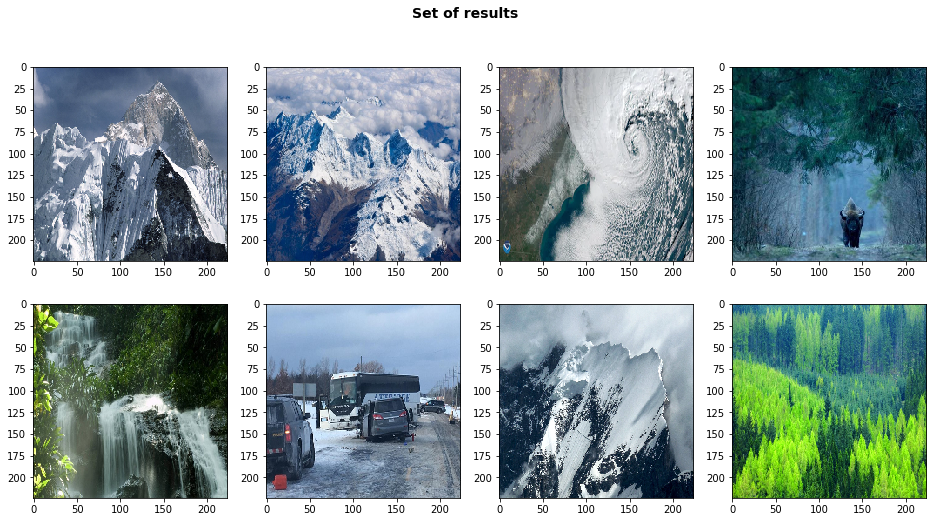

In [17]:
display_results('mountain')

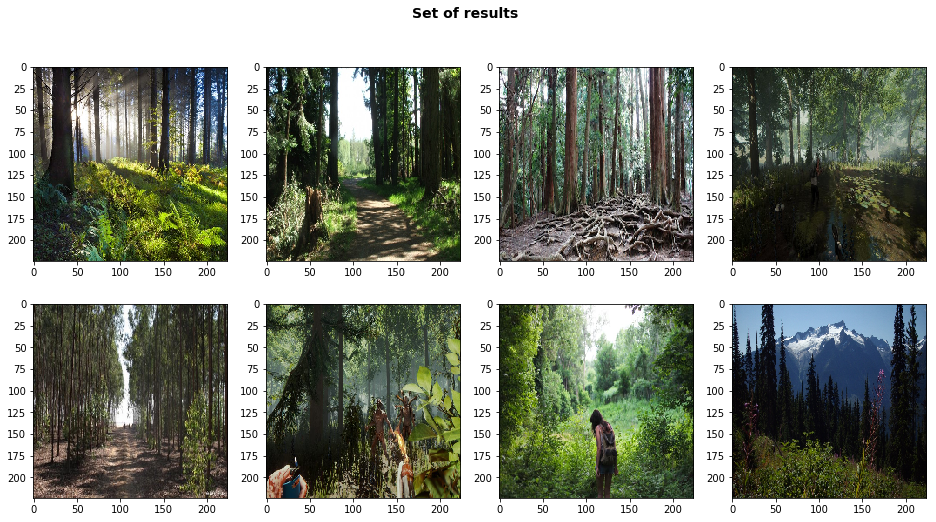

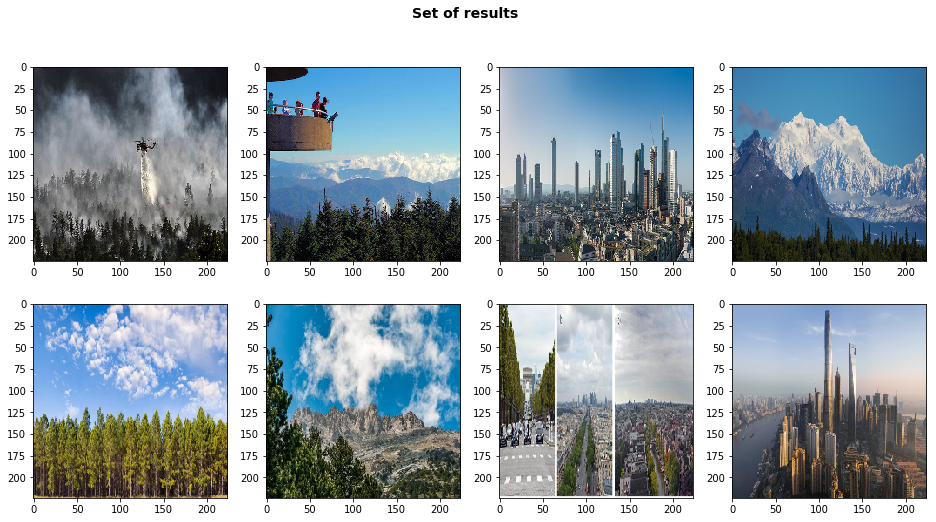

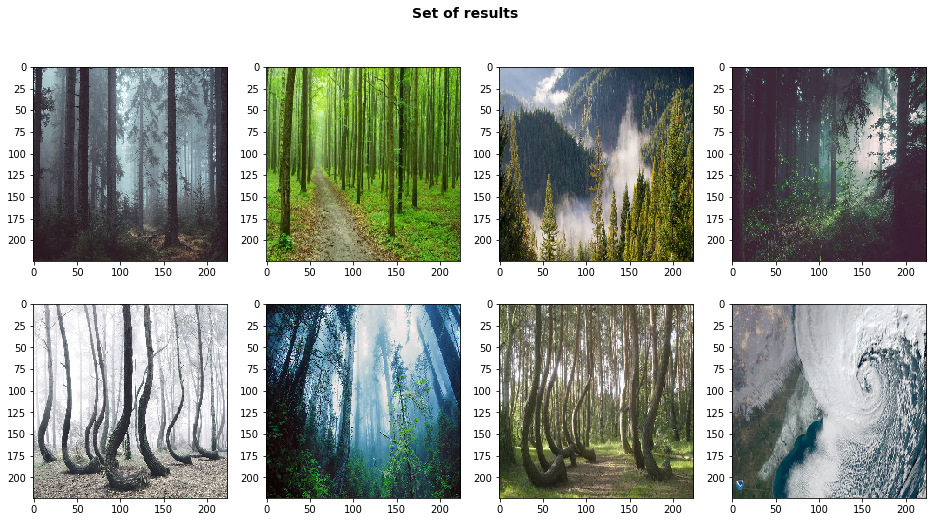

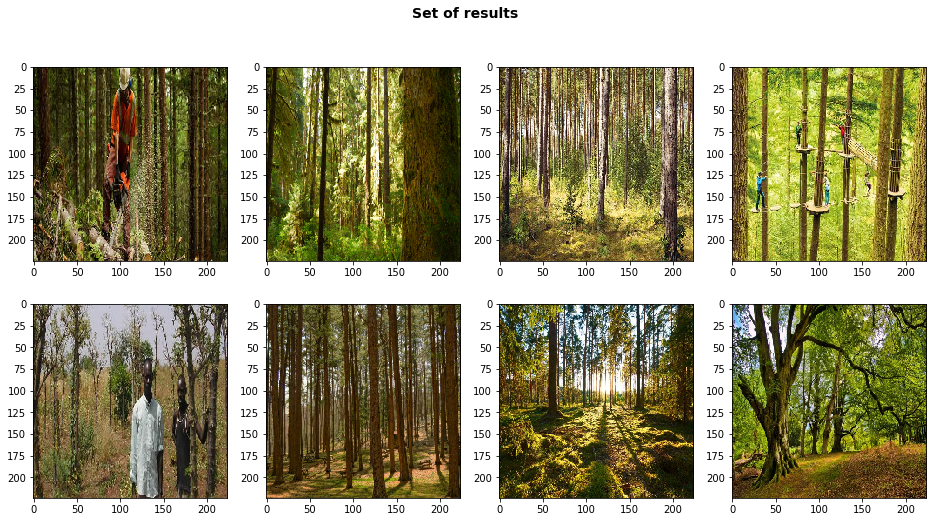

In [18]:
display_results('forest')

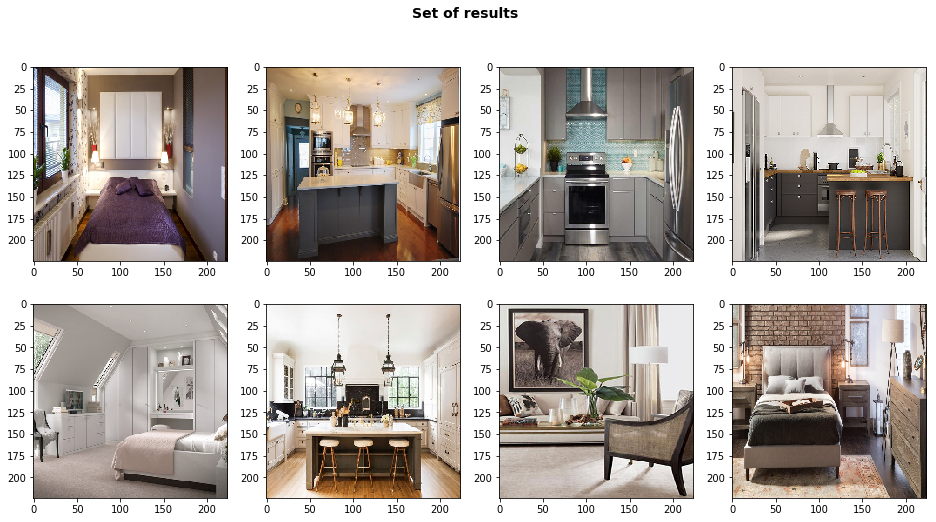

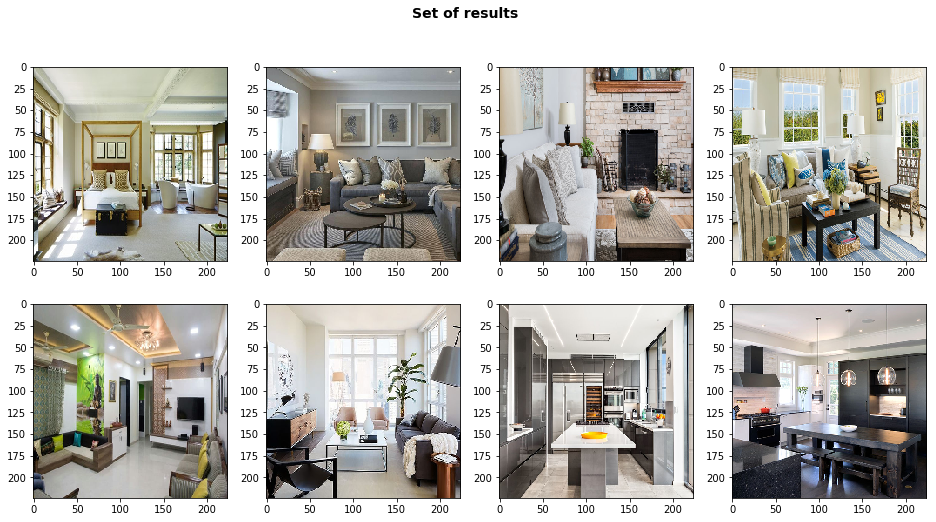

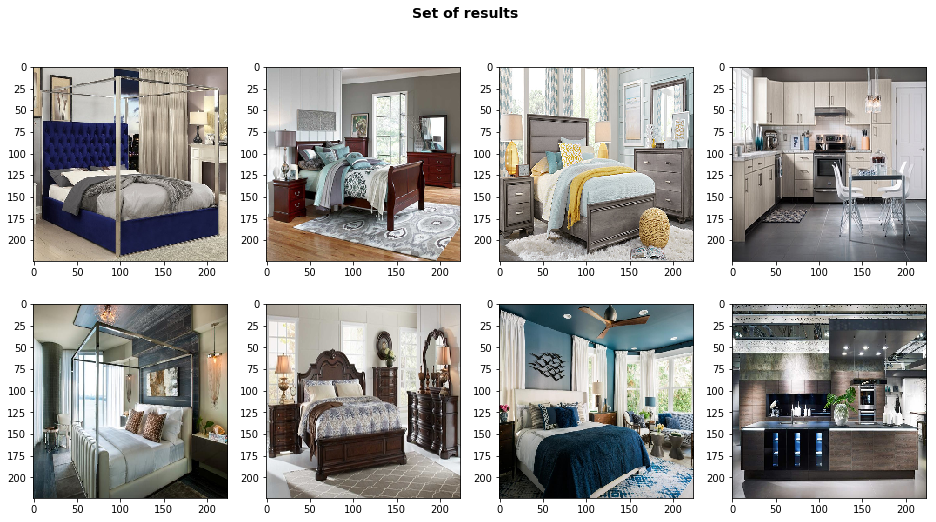

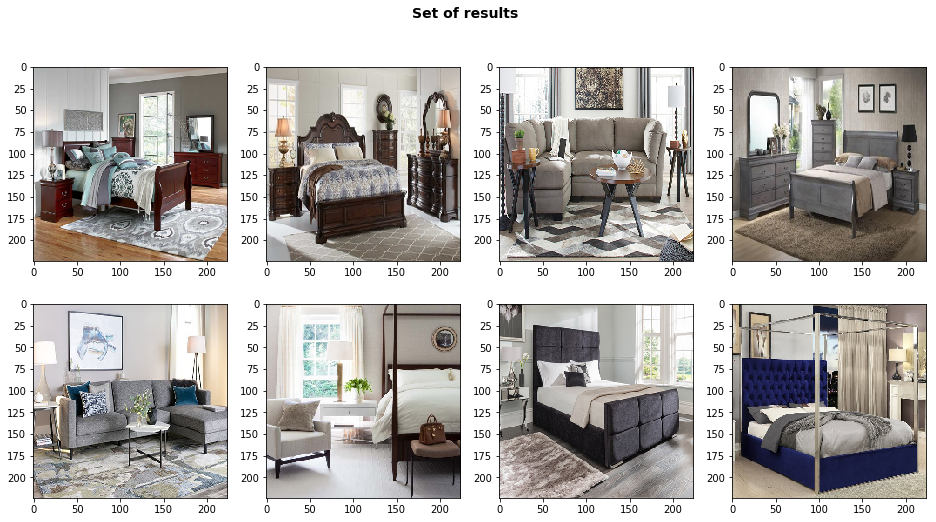

In [19]:
display_results('bedroom')

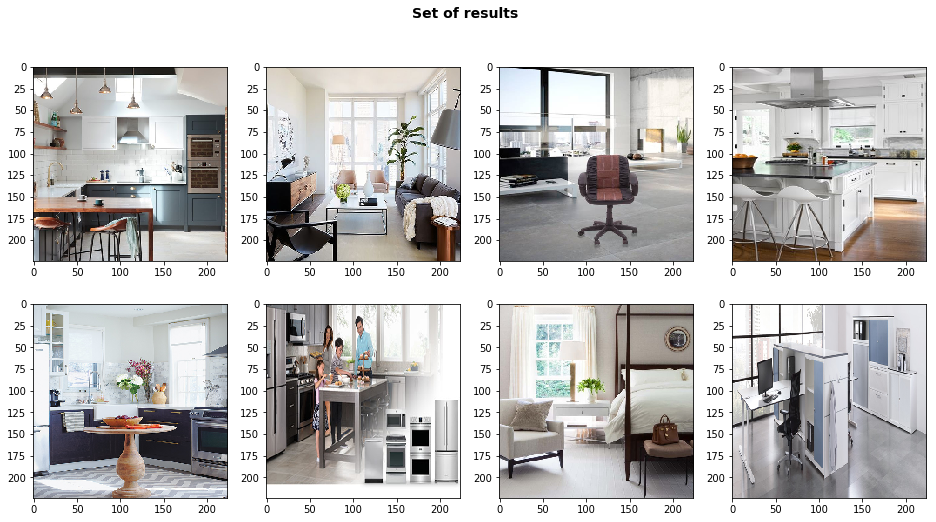

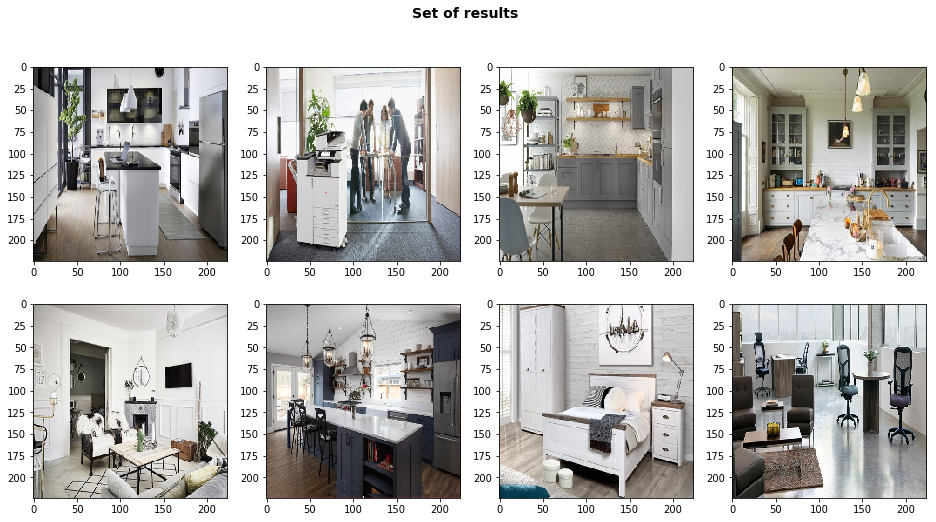

In [ ]:
display_results('kiten')

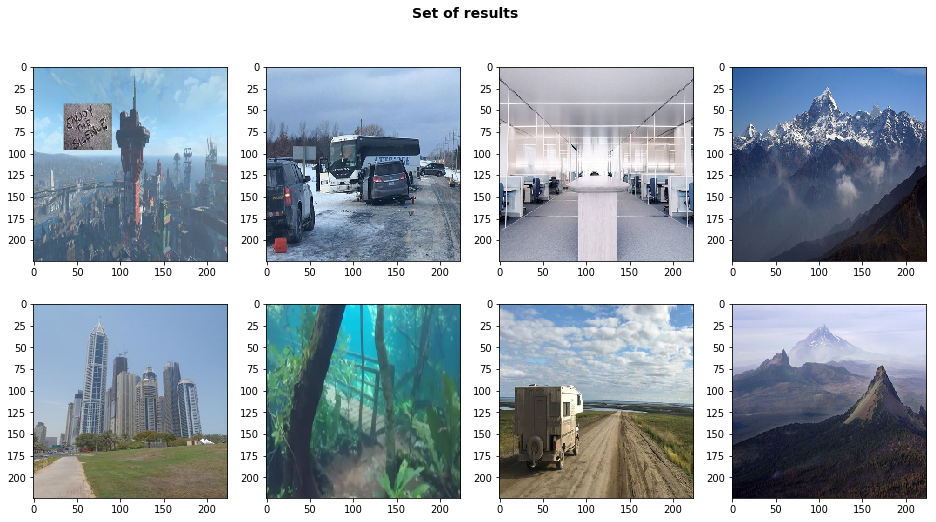

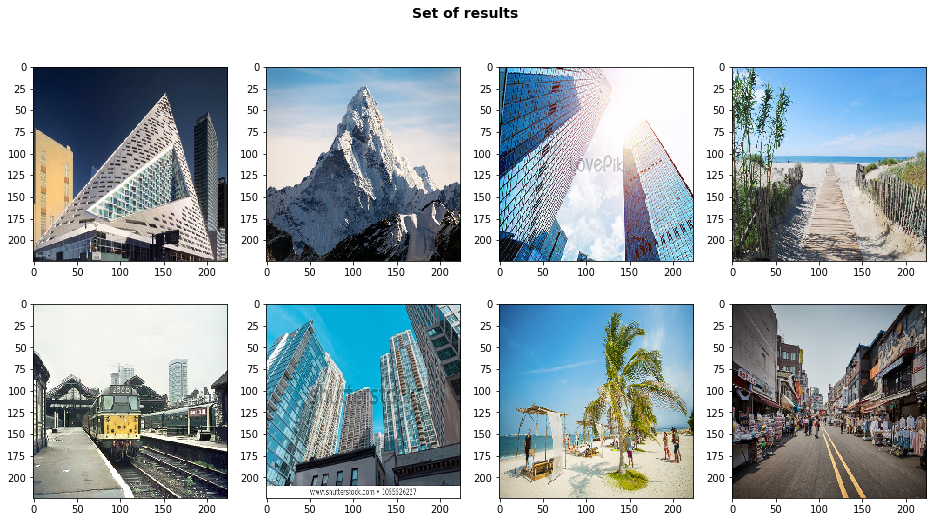

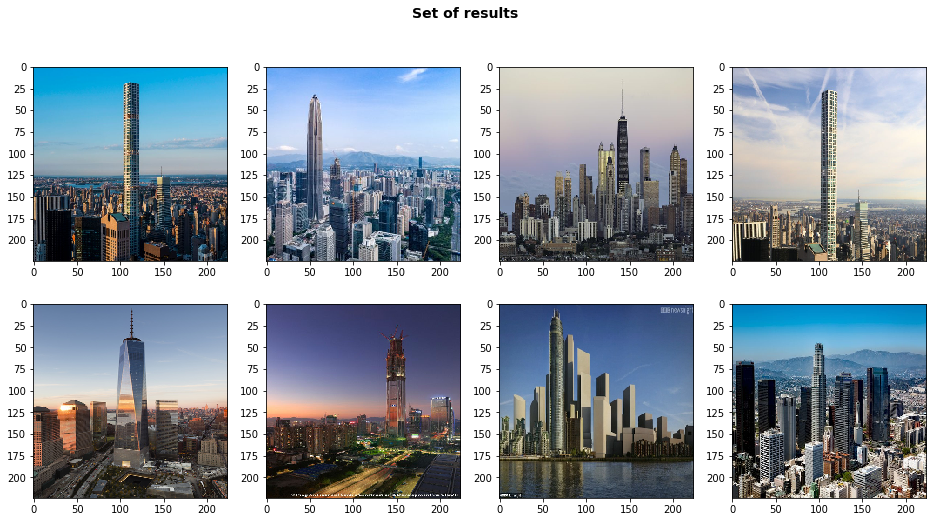

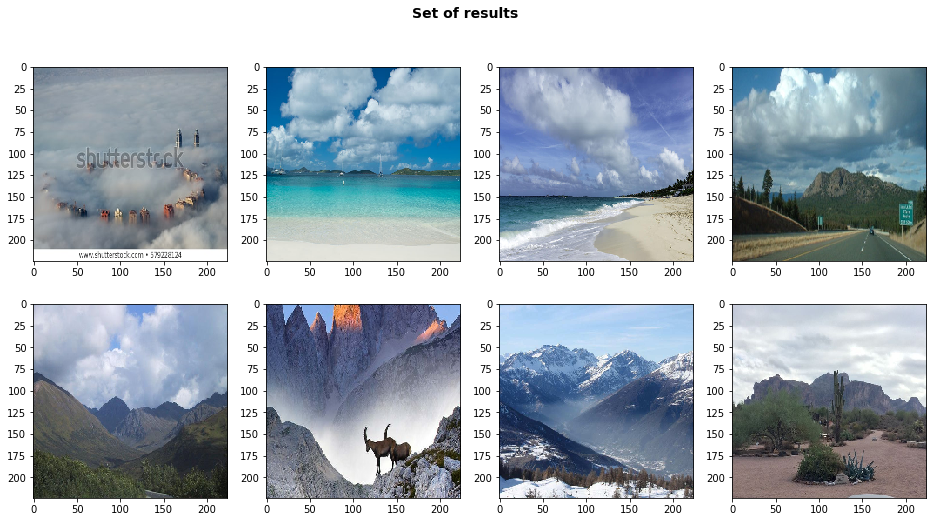

In [57]:
display_results('tall buildings')